# ID Classification (Preprocess, Model Training and Evaluation)

Note: I tried to set seeds yet did not have time to run all the cells from top to down, so no guarantee that the output will be the same.

### Set up environment

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
rootpath='/content/drive/My Drive/ID classification/'

Mounted at /content/drive


In [2]:
import os
import pandas as pd
from tqdm import tqdm
import numpy as np
import tensorflow as tf
import random
from tensorflow.keras.applications import MobileNetV3Large
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input
from tensorflow.keras.models import Model

np.random.seed(66)
random.seed(66)
tf.random.set_seed(66)

In [3]:
def extract_features_batch(img_batch):
    # load the pretrain model to get the features
    base_model = MobileNetV3Large(weights='imagenet', include_top=False, pooling='avg')
    features = base_model.predict(img_batch)
    return features


def load_image_for_mobilenet(img_path):
    # logad images and preprocess for mobilenet
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)  # img_array now has shape (1, 224, 224, 3)
    img_array = preprocess_input(img_array)  # scales the pixel values to [-1, 1]

    return img_array

### View the data set

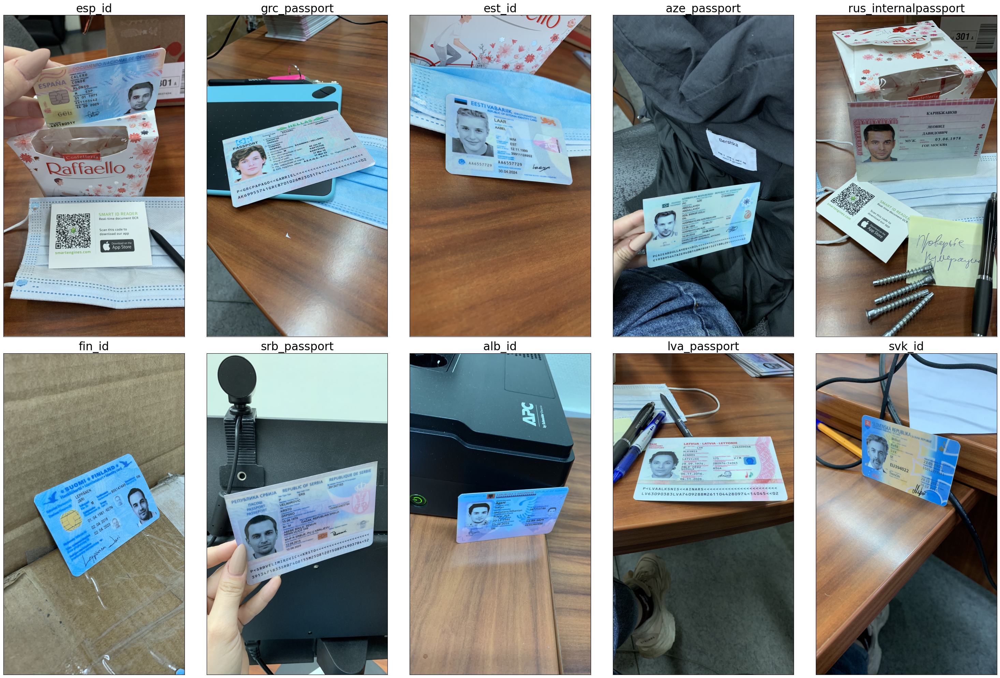

In [7]:
from matplotlib import pyplot as plt
import os
from PIL import Image
base_path = rootpath + '/images/'
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(30, 20))
axes = axes.flatten()
for i, dir_name in enumerate(os.listdir(base_path)):
    img = Image.open(os.path.join(base_path, dir_name, '00.jpg'))
    axes[i].imshow(img)
    axes[i].set_xticks([])
    axes[i].set_yticks([])
    axes[i].set_title(os.path.basename(dir_name), fontsize=24)
plt.tight_layout()
plt.show()

### Load images and preprocess

In [4]:
base_path = rootpath + '/images/'
pre_all = np.zeros((1000,224,224,3))
y_all = []
count = 0
for dir_name in os.listdir(base_path):
    print(dir_name)
    for i in tqdm(range(100)):
        pre_all[count,:,:,:] = load_image_for_mobilenet(os.path.join(base_path, dir_name, f"{i:02}.jpg"))
        y_all.append(dir_name)
        count += 1

esp_id


100%|██████████| 100/100 [01:36<00:00,  1.04it/s]


grc_passport


100%|██████████| 100/100 [01:33<00:00,  1.07it/s]


est_id


100%|██████████| 100/100 [01:29<00:00,  1.12it/s]


aze_passport


100%|██████████| 100/100 [01:32<00:00,  1.08it/s]


rus_internalpassport


100%|██████████| 100/100 [01:31<00:00,  1.10it/s]


fin_id


100%|██████████| 100/100 [01:17<00:00,  1.29it/s]


srb_passport


100%|██████████| 100/100 [01:33<00:00,  1.07it/s]


alb_id


100%|██████████| 100/100 [01:28<00:00,  1.13it/s]


lva_passport


100%|██████████| 100/100 [01:22<00:00,  1.21it/s]


svk_id


100%|██████████| 100/100 [01:25<00:00,  1.16it/s]


In [5]:
pre_all.shape, len(y_all)

((1000, 224, 224, 3), 1000)

In [6]:
pre_all[0][0][0]

array([82., 91., 90.])

Get mobilenet featrues

In [7]:
features = extract_features_batch(pre_all)
features.shape

32/32 [==============================] - 4s 14ms/step


(1000, 960)

In [8]:
np.save(rootpath+'mobile3_x2.npy', features)
y_all = pd.DataFrame({'Label':y_all})
y_all.to_csv(rootpath + 'mobile3_y2.csv')

In [35]:
features = np.load(rootpath+'mobile3_x2.npy')
features.shape
y_all = pd.read_csv(rootpath + 'mobile3_y2.csv', index_col=0)
y_all.shape
features.shape, y_all.shape

((1000, 960), (1000, 1))

### Split into Train 70%, Valid 20% and Test 10%

In [36]:
from sklearn.model_selection import train_test_split
X_train, X_valid, y_train, y_valid = train_test_split(features, y_all, test_size=0.3, stratify=y_all, random_state=66)
X_valid, X_test, y_valid, y_test = train_test_split(X_valid, y_valid, test_size=1/3, stratify=y_valid, random_state=66)
X_train.shape, X_valid.shape, X_test.shape, y_train.shape, y_valid.shape, y_test.shape

((700, 960), (200, 960), (100, 960), (700, 1), (200, 1), (100, 1))

In [10]:
indices = y_train.index.to_numpy()
test_indices = y_test.index.to_numpy()
indices[:5]

array([405,  13, 534,   2, 157])

In [14]:
y_all['set'] = None
y_all.loc[y_train.index, 'set'] = 'Train'
y_all.loc[y_valid.index, 'set'] = 'Valid'
y_all.loc[y_test.index, 'set'] = 'Test'
y_all.head(3)

,Label,set
0,esp_id,Valid
1,esp_id,Train
2,esp_id,Train


In [15]:
y_all.to_csv(rootpath + 'mobile3_y_set2.csv')

### Data Augmentation (Rotation 90, 180, 270 degrees)

In [20]:
selected_data = pre_all[indices]
selected_data.shape

(700, 224, 224, 3)

In [45]:
rotated_90 = np.rot90(selected_data, k=1, axes=(1,2))
rotated_180 = np.rot90(selected_data, k=2, axes=(1,2))
rotated_270 = np.rot90(selected_data, k=3, axes=(1,2))
X_aug = np.concatenate((selected_data, rotated_90, rotated_180, rotated_270), axis=0)
X_aug = extract_features_batch(X_aug)
X_aug.shape

88/88 [==============================] - 2s 12ms/step


(2800, 960)

### Label preprocessing

Choosed one hot encoding cause the classes do not have ordinal relationships

In [15]:
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(sparse=False)
y_train = encoder.fit_transform(y_train)
y_valid = encoder.transform(y_valid)
y_test = encoder.transform(y_test)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [40]:
y_aug = np.concatenate((y_train,y_train,y_train,y_train), axis=0)
y_aug.shape

(2800, 10)

In [18]:
encoder.categories_

[array(['alb_id', 'aze_passport', 'esp_id', 'est_id', 'fin_id',
        'grc_passport', 'lva_passport', 'rus_internalpassport',
        'srb_passport', 'svk_id'], dtype=object)]

In [35]:
import pickle
pickle.dump(encoder, open(rootpath + 'encoder3-2.pkl', 'wb'))

### Hyperparameter tuning

Choosed a simple structure to avoid overfitting our small traning set

In [ ]:
!pip install keras-tuner

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.regularizers import l2
from keras_tuner import HyperModel, Hyperband

class MyHyperModel(HyperModel):
    def __init__(self, input_shape, num_classes):
        self.input_shape = input_shape
        self.num_classes = num_classes

    def build(self, hp):
        inp_fea = layers.Input(shape=self.input_shape)

        h1_units = hp.Int('units_h1', min_value=128, max_value=512, step=32)
        h1 = layers.Dense(h1_units, activation='relu', kernel_regularizer=l2(hp.Float('l2_h1', min_value=0.0001, max_value=0.01, sampling='log')))(inp_fea)
        h1_dropout_rate = hp.Float('dropout_h1', min_value=0.2, max_value=0.6, step=0.1)
        h1_dropout = layers.Dropout(h1_dropout_rate)(h1)

        h2_units = hp.Int('units_h2', min_value=128, max_value=512, step=32)
        h2 = layers.Dense(h2_units, activation='relu', kernel_regularizer=l2(hp.Float('l2_h2', min_value=0.0001, max_value=0.01, sampling='log')))(h1_dropout)
        h2_dropout_rate = hp.Float('dropout_h2', min_value=0.2, max_value=0.6, step=0.1)
        h2_dropout = layers.Dropout(h2_dropout_rate)(h2)

        cls_o = layers.Dense(self.num_classes, activation='softmax')(h2_dropout)

        model = tf.keras.Model(inputs=inp_fea, outputs=cls_o)

        model.compile(optimizer=tf.keras.optimizers.Adam(hp.Choice('learning_rate', values=[0.01, 0.005, 0.001, 0.0005, 0.0001])),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])

        return model

input_shape = (960,)
num_classes = 10

hypermodel = MyHyperModel(input_shape=input_shape, num_classes=num_classes)

tuner = Hyperband(
    hypermodel.build,
    objective='val_accuracy',
    max_epochs=30,
    directory=rootpath+'tuner',
    project_name='my_tuner-2',
    seed=66
)

In [71]:
stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)
tuner.search(X_aug, y_aug, epochs=20, batch_size=128, validation_data=(X_valid, y_valid), callbacks=[stop_early])
best_hps=tuner.get_best_hyperparameters(num_trials=1)[0]

Trial 84 Complete [00h 00m 04s]
val_accuracy: 0.875

Best val_accuracy So Far: 0.925000011920929
Total elapsed time: 00h 05m 03s


In [124]:
best_hps=tuner.get_best_hyperparameters(num_trials=2)[0]
print(f"The best units_h1 is {best_hps.get('units_h1')}.")
print(f"The best dropout_h1 is {best_hps.get('dropout_h1')}.")
print(f"The best units_h2 is {best_hps.get('units_h2')}.")
print(f"The best dropout_h2 is {best_hps.get('dropout_h2')}.")
print(f"The best learning rate is {best_hps.get('learning_rate')}.")
print(f"The best l2_h1 is {best_hps.get('l2_h1')}.")
print(f"The best l2_h2 is {best_hps.get('l2_h2')}.")

The best units_h1 is 480.
The best dropout_h1 is 0.30000000000000004.
The best units_h2 is 288.
The best dropout_h2 is 0.5.
The best learning rate is 0.001.
The best l2_h1 is 0.0005708505552507687.
The best l2_h2 is 0.0005957914791572176.


### Custom Multilayer Perceptron Model Training

I changed the learning rate to a smaller value for getting more stablelised results

In [ ]:
from tensorflow.keras.callbacks import Callback

class SaveModelEveryNEpochs(Callback):
    def __init__(self, save_freq, save_path):
        super(SaveModelEveryNEpochs, self).__init__()
        self.save_freq = save_freq
        self.save_path = save_path

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.save_freq == 0:
            model_path = os.path.join(self.save_path, 'model_epoch_{}.h5'.format(epoch + 1))
            self.model.save(model_path)
            print('\nSaved model to {}\n'.format(model_path))


save_path = rootpath + 'models3-2'
save_every_100_epochs = SaveModelEveryNEpochs(save_freq=50, save_path=save_path)
save_path

In [190]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.regularizers import l2

inp_fea = layers.Input((960,))

h1 = layers.Dense(480, activation='relu', kernel_regularizer=l2(0.00057))(inp_fea)
h1_dropout = layers.Dropout(0.3)(h1)

h2 = layers.Dense(288, activation='relu', kernel_regularizer=l2(0.0006))(h1_dropout)
h2_dropout = layers.Dropout(0.5)(h2)

cls_o = layers.Dense(10, activation='softmax')(h2_dropout)

strong_super_model = tf.keras.Model(inp_fea, cls_o)

strong_super_model.summary()

Model: "model_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_19 (InputLayer)       [(None, 960)]             0         
                                                                 
 dense_54 (Dense)            (None, 480)               461280    
                                                                 
 dropout_36 (Dropout)        (None, 480)               0         
                                                                 
 dense_55 (Dense)            (None, 288)               138528    
                                                                 
 dropout_37 (Dropout)        (None, 288)               0         
                                                                 
 dense_56 (Dense)            (None, 10)                2890      
                                                                 
Total params: 602698 (2.30 MB)
Trainable params: 602698 (2

In [ ]:
optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002)
loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False)
strong_super_model.compile(optimizer=optimizer,
           loss=[loss],
           metrics=['accuracy'])

strong_super_hisotry=strong_super_model.fit(X_aug,
                                              y_aug,
                                              validation_data=(X_valid,y_valid),
                                              epochs=1000, batch_size=128,
                                              callbacks=[save_every_100_epochs]
                                            )

### Model Evaluation

In [13]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

def plt_traning_history(model_history):
    # Plot training & validation accuracy values
    plt.figure(figsize=(14, 5))

    # Accuracy Plot
    plt.subplot(1, 2, 1)
    plt.plot(model_history.history['accuracy'])
    plt.plot(model_history.history['val_accuracy'])
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='lower right')

    # Loss Plot
    plt.subplot(1, 2, 2)
    plt.plot(model_history.history['loss'])
    plt.plot(model_history.history['val_loss'])
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper right')

    plt.show()

def sklearn_eavl(y_true, y_predict):
    precision_a = precision_score(y_true, y_predict, average='macro')
    recall_a = recall_score(y_true, y_predict, average='macro')
    f1_a = f1_score(y_true, y_predict, average='macro')
    precision_i = precision_score(y_true, y_predict, average='micro')
    recall_i = recall_score(y_true, y_predict, average='micro')
    f1_i = f1_score(y_true, y_predict, average='micro')
    accuracy = accuracy_score(y_true, y_predict)
    print(f"Precision Macro: {precision_a:.3f}")
    print(f"Recall Macro: {recall_a:.3f}")
    print(f"F1 Score Macro: {f1_a:.3f}")
    print(f"Precision Micro: {precision_i:.3f}")
    print(f"Recall Micro: {recall_i:.3f}")
    print(f"F1 Score Micro: {f1_i:.3f}")
    print(f"Accuracy: {accuracy:.3f}")

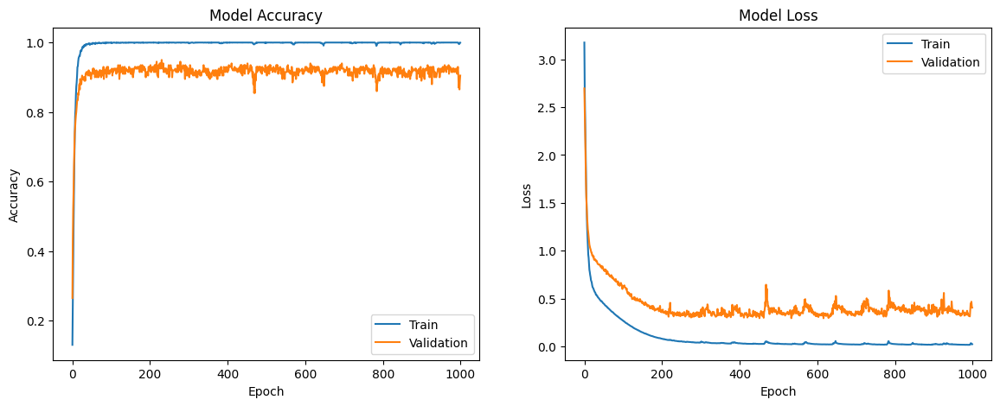

In [198]:
plt_traning_history(strong_super_hisotry)

Choosed epoch 250 cause it's at a relatively stable position where accuracy is hight and loss is low

In [11]:
strong_super_model = tf.keras.models.load_model(rootpath + 'models3-2/model_epoch_250.h5')
predict = strong_super_model.predict(X_test).argmax(axis=1)


4/4 [==============================] - 1s 2ms/step


In [17]:
sklearn_eavl(y_test.argmax(axis=1),predict)

Precision Macro: 0.935
Recall Macro: 0.930
F1 Score Macro: 0.929
Precision Micro: 0.930
Recall Micro: 0.930
F1 Score Micro: 0.930
Accuracy: 0.930


The results are balanced in classes

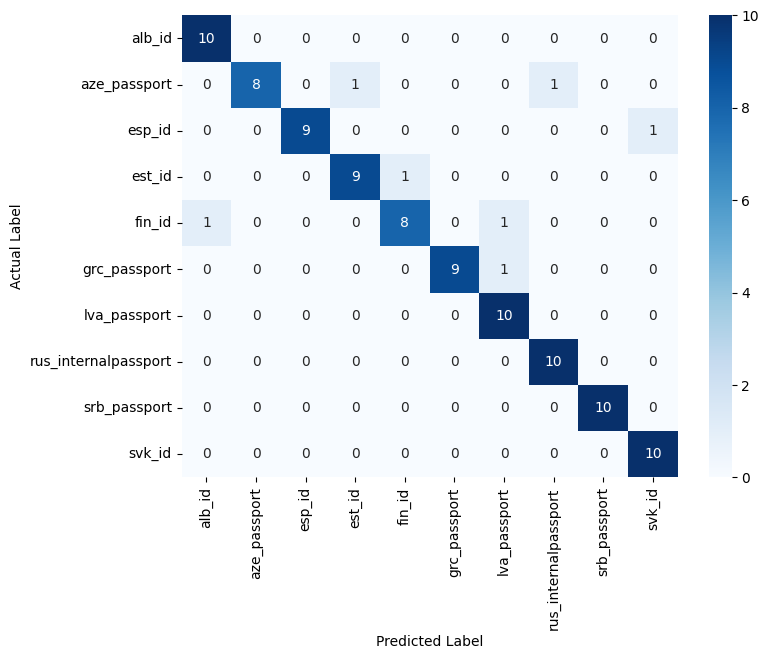

In [199]:
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Assuming 'cm' is your confusion matrix, 'y_valid' are your validation labels, and 'predict' are your model predictions
cm = confusion_matrix(y_test.argmax(axis=1), predict)

# Get unique labels for actual and predicted values
unique_y_test_labels = encoder.categories_[0]
unique_predict_labels = encoder.categories_[0]

# Plotting using seaborn for a nicer look
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues', xticklabels=unique_y_test_labels, yticklabels=unique_predict_labels)
plt.ylabel('Actual Label')
plt.xlabel('Predicted Label')
plt.show()

Aggregate results in a dataframe

In [54]:
results = pd.read_csv(rootpath + 'mobile3_y_set2.csv', index_col=0)
results = results.loc[results['set']=='Test']
results['Predict'] = strong_super_model.predict(features[sorted(test_indices)]).argmax(axis=1)
results['Score'] = strong_super_model.predict(features[sorted(test_indices)]).max(axis=1)
results['Predict class'] = None
for index, row in results.iterrows():
  results.at[index, 'Predict class'] = encoder.categories_[0][row['Predict']]
results.tail()

4/4 [==============================] - 0s 2ms/step


,Label,set,Predict,Score,Predict class
932,svk_id,Test,9,0.917235,svk_id
946,svk_id,Test,9,1.000000,svk_id
966,svk_id,Test,9,0.987552,svk_id
974,svk_id,Test,9,0.999998,svk_id
984,svk_id,Test,9,0.999999,svk_id


In [55]:
results.to_csv(rootpath + 'mobile3_y_set2_result_classes.csv')

Find the average and standard deviation of the prediction score for the confidence colour implementation in the app.

In [22]:
# import pandas as pd
# results = pd.read_csv(rootpath + 'mobile3_y_set2_result_classes.csv', index_col=0)
# results

In [12]:
matching_df = results[results['Label'] == results['Predict class']]
non_matching_df = results[results['Label'] != results['Predict class']]
matching_mean = matching_df['Score'].mean()
matching_std = matching_df['Score'].std()
non_matching_mean = non_matching_df['Score'].mean()
non_matching_std = non_matching_df['Score'].std()

print(f"Matching Rows - Avg Score: {matching_mean}, Std: {matching_std}")
print(f"Non-Matching Rows - Avg Score: {non_matching_mean}, Std: {non_matching_std}")

Matching Rows - Avg Score: 0.9450838734408603, Std: 0.1161624166403965
Non-Matching Rows - Avg Score: 0.71036447, Std: 0.26079832869266883


Misclassified cases in the Test set

In [13]:
non_matching_df

,Label,set,Predict,Score,Predict class
31,esp_id,Test,9,0.941222,svk_id
154,grc_passport,Test,6,0.435988,lva_passport
254,est_id,Test,4,0.792489,fin_id
335,aze_passport,Test,3,0.697003,est_id
361,aze_passport,Test,7,0.974809,rus_internalpassport
512,fin_id,Test,6,0.282056,lva_passport
532,fin_id,Test,0,0.848983,alb_id


Below are the images that was predicted to the wrong class

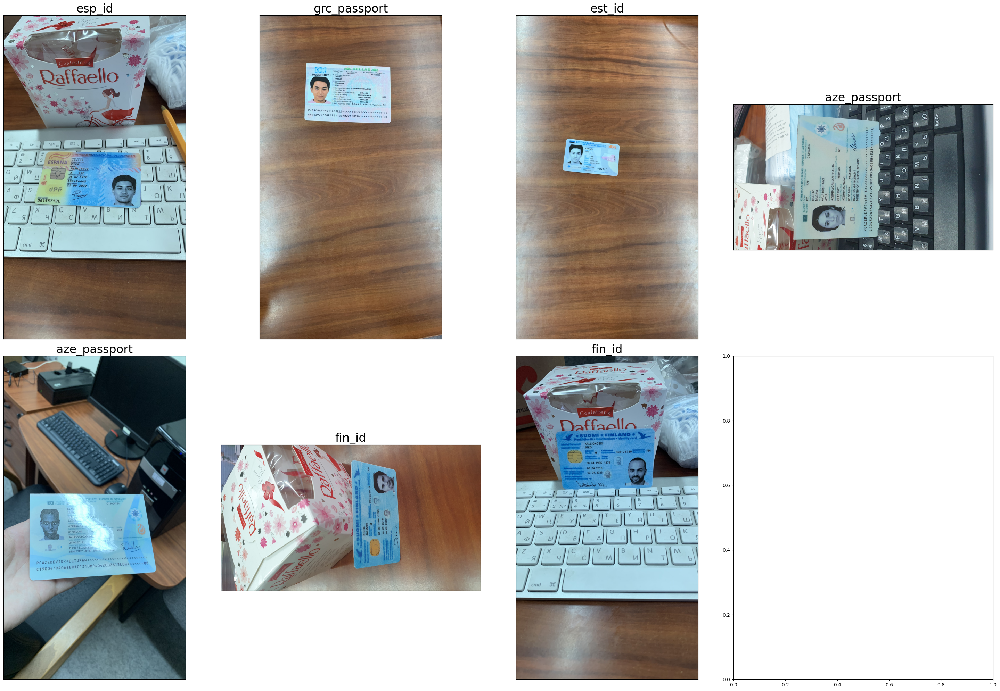

In [24]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(30, 20))
axes = axes.flatten()
i = 0
for index, label in zip(non_matching_df.index.to_list(), non_matching_df.Label.to_list()):
    img = Image.open(os.path.join(base_path, label, str(index)[-2:]+'.jpg'))
    axes[i].imshow(img)
    axes[i].set_xticks([])
    axes[i].set_yticks([])
    axes[i].set_title(os.path.basename(label), fontsize=24)
    i+=1
plt.tight_layout()
plt.show()

Thank you for reading:)